# Sentiment Analysis of Boston's Airbnb Reviews

Team 11 members : **Jinke Han, Yifan Fan, Xiang Liu, Qianyi Mo**.    

Date: **26/02/2024**

#Summary

In our project, we embarked on a comprehensive examination of Airbnb reviews and listings in Boston to understand guest experiences and preferences. Our data preparation phase involved cleaning and preprocessing two datasets to ensure quality and relevance for analysis. During the exploratory data analysis (EDA), we observed trends such as a decrease in reviews during 2020 due to the pandemic, a preference for entire homes/apartments, and generally high guest satisfaction. We further conducted topic analysis using the gensim library to uncover prevalent themes in the reviews and evaluated our model for coherence and perplexity, optimizing it based on the findings. This study aims to provide insights into the sentiment and preferences of Airbnb users in Boston, guiding improvements in service and offerings.

#Table of Contents

1. Introduction

  1.1 Problem Statement & Motivation

  1.2 Business Value

  1.3 Dataset Description

2. Data Explore

  2.1 Data Preprocessing

  2.2 EDA

3. Text Mining

  3.1 Detect Non-English Words

  3.2 Using Regex to clean text

  3.3 Tokenization

  3.4 Word Cloud

4. Topic Analysis

5. Model Evaluation

6. Alpha and Eta in LDA

7. LDA Visualization

  7.1 Word Clouds

  7.2 Intertopic Distance Map

8. Conclusions

9. Reference

#1.Introduction


##1.1 Problem Statement & Motivation

In the dynamic market of Airbnb, understanding guest sentiment and the factors influencing their experiences is crucial for both hosts and guests. The recent shifts in travel trends and accommodation preferences underscore the importance of this understanding. Our project is geared towards utilizing Natural Language Processing (NLP) to analyze guest reviews, identifying key factors that contribute to their satisfaction or dissatisfaction. The goal is to provide actionable insights that hosts can use to enhance their services and assist guests in making informed decisions, ultimately enhancing the quality of Airbnb stays in Boston.


## 1.2 Business value

Our project offers multi-faceted benefits to Boston's Airbnb ecosystem. By analyzing guest feedback across neighborhoods, we provide Airbnb with detailed insights for better user matching, enhancing customer satisfaction, and competitive edge. Hosts gain valuable feedback to improve listings and adjust amenities, potentially increasing occupancy rates. For guests, the project enables more informed accommodation choices, aligning with their expectations and needs. Overall, this initiative serves as a strategic tool for all stakeholders in the Airbnb market.

## 1.3 Dateset Description

Our dataset provides insights into past customers' experiences and offers detailed reviews about their stays, including details such as the reviewer's name, specific comments, and more. This dataset allows us to better understand each customer's perspective on the apartment and is perfect for those who want to fully understand what makes the Airbnb experience so special. The project datasets were sourced from Inside Airbnb, accessible here: http://insideairbnb.com/get-the-data. We have three datasets: listings with 4,204 rows and 75 columns, calendars with 1,534,396 rows and 7 columns, and reviews with 182,482 rows and 6 columns. We will merge them and select the data from March 21, 2009, to December 18, 2023.

# 2.Data Explore

## 2.1 Data preprocessing

Firstly, import the necessary library and dataset.

In [2]:
import pandas as pd
from datetime import datetime
import seaborn as sns
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")

C:\Users\13870\AppData\Local\Temp\ipykernel_12928\2954812271.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


Keep the columns that we need and drop the columns that are meaningless.

In [3]:
df_reviews = pd.read_csv('https://raw.githubusercontent.com/jinke7678/BA820_Project_Team11/main/data/reviews.csv')
df_reviews.drop(['id','reviewer_name'], axis=1, inplace=True)
df_reviews.rename(columns={'date': 'review_date'}, inplace=True)
df_reviews

,listing_id,review_date,reviewer_id,comments
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...
4,3781,2015-10-30,15151513,Great value for the money! This location has e...
...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...


In [4]:
df_list=pd.read_csv('https://raw.githubusercontent.com/jinke7678/BA820_Project_Team11/main/data/listings.csv')

In [5]:
columns_to_keep= [
    'id','neighbourhood_cleansed','price', 'latitude', 'longitude',
    'room_type', 'number_of_reviews','review_scores_rating']
df_list1= df_list[columns_to_keep]
df_list1 = df_list1.drop_duplicates()
df_list1.rename(columns={'id': 'listing_id'}, inplace=True)
df_list1

,listing_id,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
1,5506,Roxbury,$135.00,42.328440,-71.095810,Entire home/apt,122,4.79
2,6695,Roxbury,$179.00,42.328020,-71.093870,Entire home/apt,127,4.81
3,8789,Beacon Hill,$91.00,42.358670,-71.063070,Entire home/apt,27,4.67
4,10813,Back Bay,$86.00,42.350610,-71.087870,Entire home/apt,5,5.00
...,...,...,...,...,...,...,...,...
4199,1046563598019556549,Dorchester,$83.00,42.285236,-71.069907,Entire home/apt,1,5.00
4200,1046568292864752336,Downtown,$107.00,42.352970,-71.063690,Entire home/apt,0,NaN
4201,1047166785349446101,Fenway,$136.00,42.347480,-71.090780,Entire home/apt,0,NaN
4202,1047226383263246733,Dorchester,$83.00,42.285161,-71.067922,Entire home/apt,0,NaN


Merge our two datasets using left join.

In [6]:
df = pd.merge(df_reviews, df_list1, on='listing_id', how='left')
df

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
4,3781,2015-10-30,15151513,Great value for the money! This location has e...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,$110.00,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,$140.00,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50


Dropping null values and using the average price of each room type to fill the missing values.

In [7]:
df.isna().sum()

listing_id                   0
review_date                  0
reviewer_id                  0
comments                    57
neighbourhood_cleansed       0
price                     7901
latitude                     0
longitude                    0
room_type                    0
number_of_reviews            0
review_scores_rating         0
dtype: int64

In [8]:
data = df.dropna(subset=['comments'])
data

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
4,3781,2015-10-30,15151513,Great value for the money! This location has e...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,$110.00,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,$140.00,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50


In [9]:
data['price'] = data['price'].str.replace('$', '').str.replace(',', '').astype(float)

In [10]:
price_means = data.groupby(['room_type'])['price'].transform('mean')
data['price'] = data['price'].fillna(price_means)

In [11]:
data['review_date'] = pd.to_datetime(df['review_date'])
data= data[data['review_date'].dt.year.between(2019, 2023)]

In [12]:
data

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
14,3781,2019-02-22,83031353,My partner and I stayed at Frank's apartment f...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
15,3781,2019-12-21,3918963,I liked very much this apartment rented by Fra...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
16,3781,2020-09-03,344701185,I stayed at Frank's apartment for three months...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
17,3781,2020-12-20,348888007,Wonderful 1 bedroom with a great location! The...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
18,3781,2021-02-26,345613836,Great place - amazing location. Highly recom...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,110.0,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,140.0,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,144.0,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,144.0,42.325558,-71.073339,Entire home/apt,2,4.50


## 2.2 EDA

Firstly, let's have a look at the correlation among each variable. It seems that all the variables don't have a strong correlation.

In [13]:
corr = data.corr()
corr

,listing_id,reviewer_id,price,latitude,longitude,number_of_reviews,review_scores_rating
listing_id,1.000000,0.116905,0.016125,-0.043077,-0.003945,-0.330101,-0.048088
reviewer_id,0.116905,1.000000,-0.046403,-0.037376,0.012029,-0.054660,-0.058027
price,0.016125,-0.046403,1.000000,0.029094,0.013210,-0.162282,0.098029
latitude,-0.043077,-0.037376,0.029094,1.000000,0.425890,0.252399,-0.123030
longitude,-0.003945,0.012029,0.013210,0.425890,1.000000,0.256565,-0.094537
number_of_reviews,-0.330101,-0.054660,-0.162282,0.252399,0.256565,1.000000,0.190047
review_scores_rating,-0.048088,-0.058027,0.098029,-0.123030,-0.094537,0.190047,1.000000


In [14]:
sns.pairplot(data, diag_kind='kde')
plt.show()

KeyboardInterrupt: 

In [ ]:
comments_per_year = data['review_date'].dt.year.value_counts().sort_index()
print(comments_per_year)

In [ ]:
plt.figure(figsize=(10, 5))
comments_per_year.plot(kind='line', marker='o')
plt.title('Number of Comments per Year (2019-2023)')
plt.xlabel('Year')
plt.ylabel('Number of Comments')
plt.xticks(rotation=0)
plt.show()


The reason why 2020 has the least reviews number is that the epidemic broke out in 2019 and the tourism and hotel industry developed sluggishly. As the epidemic gradually improves, the tourism industry recovers, and the homestay industry gradually returns to normal. This also explains why the number of airbnb reviews dropped sharply in 2020, then increased year by year and returned to a stable level.

In [ ]:
# Histogram for 'review_scores_rating'
plt.figure(figsize=(10, 6))
plt.hist(data['review_scores_rating'], bins=10, color='steelblue', edgecolor='black')
plt.title('Histogram of Review Scores Rating')
plt.xlabel('Review Scores Rating')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.1)
plt.show()

This histogram illustrates the distribution of hotel review scores, primarily showing higher guest satisfaction. Scores range from 20 to 100, with most hotels scoring higher, indicating that most guests had a positive experience. Low-scoring hotels are rare and stand out for the overall quality of accommodation provided and guest satisfaction.

In [ ]:
room_counts = data['room_type'].value_counts().sort_index()
print(room_counts)

In [ ]:
import matplotlib.pyplot as plt

room_counts = {
    'Entire home/apt': 93024,
    'Hotel room': 377,
    'Private room': 42278,
    'Shared room': 703
}

sorted_room_counts = dict(sorted(room_counts.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_room_counts.keys(), sorted_room_counts.values())

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

plt.title('Room Type Distribution - Bar Chart')
plt.xlabel('Room Type')
plt.ylabel('Number of Listings')
plt.show()


# 3.Text Mining

Make a copy of the data to avoid any disruption.

In [12]:
data.info()
data1 = data.copy()

<class 'pandas.core.frame.DataFrame'>
Index: 136377 entries, 14 to 182481
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   listing_id              136377 non-null  int64         
 1   review_date             136377 non-null  datetime64[ns]
 2   reviewer_id             136377 non-null  int64         
 3   comments                136377 non-null  object        
 4   neighbourhood_cleansed  136377 non-null  object        
 5   price                   136377 non-null  float64       
 6   latitude                136377 non-null  float64       
 7   longitude               136377 non-null  float64       
 8   room_type               136377 non-null  object        
 9   number_of_reviews       136377 non-null  int64         
 10  review_scores_rating    136377 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3), object(3)
memory usage: 12.5+ MB


## 3.1 Detect for non-English words


In [13]:
!pip install langdetect

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple



[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [14]:
import pandas as pd
from langdetect import detect, LangDetectException
#define a function to check the language version
def detect_language_safe(text):
    try:
        return detect(text)
    except LangDetectException:
        return None


data['language'] = data['comments'].apply(detect_language_safe)


non_english_comments_count = data[data['language'] != 'en'].shape[0]

print(f"The number of not English version reviews is: {non_english_comments_count}")

KeyboardInterrupt: 

Based on the result of printing, it is obvious that the `comments` contain some non-English words, which cannot be easily understood and analyzed by the word package. We decided to select only English words.

## 3.2 Using Regex to clean text

1. convert all text inside `comments` to lower case;
2. remove punctuation and special characters;
3. remove digits if irrelevant;
4. normalize whitespace to single space

In [15]:
!pip install nltk

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple



[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [16]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('words')

data['comments'] = data['comments'].str.lower()
data['comments'] = data['comments'].str.replace(r"[^\w\s']", '')
data['comments'] = data['comments'].str.replace(r'\d+', '', regex=True)
data['comments'] = data['comments'].str.replace(r'\s+', ' ', regex=True)
data['comments'] =data['comments'].str.strip()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\13870\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\13870\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\13870\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


## 3.3 Tokenization

1. remove stopwrods, short words, and non-English words;
2. return a list of words tokenized from `comments`;

In [17]:
english_words = set(nltk.corpus.words.words())

def remove_stopwords(sent):
    stop_word = set(stopwords.words('english'))
    words = word_tokenize(sent)
    filter_word = [x for x in words if x not in stop_word and len(x)>2 and x in english_words]
    return filter_word

data['comments'] = data['comments'].apply(remove_stopwords)
comments = data['comments']
list_doc = comments.tolist()

## 3.4 Word Cloud(+Vectorize:Word2Vec)

### Word2Vec

In [19]:
!pip install gensim

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple



[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [20]:
import gensim

In [21]:
data['comments']

14        [partner, stayed, frank, apartment, several, g...
15        [much, apartment, rented, frank, place, perfec...
16        [stayed, frank, apartment, three, stay, excell...
17        [wonderful, bedroom, great, location, apartmen...
18        [great, place, amazing, location, highly, reco...
                                ...                        
182477    [wonderful, location, walk, around, north, end...
182478                            [great, deal, responsive]
182479    [stay, place, great, apartment, spacious, caug...
182480     [good, place, solid, nice, park, inside, garage]
182481         [great, host, great, home, amazing, service]
Name: comments, Length: 136377, dtype: object

In [22]:
import gensim.downloader as api
import numpy as np
from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

def word_lemmatizer(text):
    lem_text = [WordNetLemmatizer().lemmatize(i, pos='v') for i in text]
    return lem_text

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\13870\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [23]:
data["lemmatized"] = data["comments"].apply(lambda x: word_lemmatizer(x))
data["lemmatize_joined"] = data["lemmatized"].apply(lambda x: ' '.join(x))


In [25]:
tokens = data['lemmatized']
w2v_model = Word2Vec(tokens,
                     min_count=600,
                     window=10,
                     vector_size=200,
                     alpha=0.03, 
                     min_alpha=0.0007,
                     workers = 4,
                     seed = 42)

In [45]:
def get_word_embedding(word, model):
    if word in model.wv.key_to_index:
        return model.wv[word]
    else:
        return np.zeros(model.vector_size)


embeddings = []
for review in tokens:
  review_embeddings = [get_word_embedding(word, w2v_model) for word in review ]
  review_embedding = np.mean(review_embeddings if len(review_embeddings) >0 else [np.zeros(w2v_model.vector_size)], axis=0)
  embeddings = embeddings + [review_embedding]

embeddings = np.array(embeddings)

In [44]:
embeddings.shape

NameError: name 'embeddings' is not defined

### Word Cloud

Display the wordcloud for the entire `comments`

In [19]:
from sklearn.feature_extraction.text import CountVectorizer

Count the frequency of the words
 - generate term frequency list

In [ ]:
comment = comments.apply(' '.join)
cv = CountVectorizer()
counts_word = cv.fit_transform(comment)

vocab_freq = dict(zip(cv.get_feature_names_out(), counts_word.sum(axis = 0).A1))

- sort the term frequencies

In [ ]:
sorted_comments = sorted(vocab_freq.items(), key=lambda item: item[1], reverse=True)

sorted_comments_dict = dict(sorted_comments)
print(sorted_comments_dict)

In [ ]:
!pip install wordcloud

- create a word cloud using the frequencies

In [ ]:
from wordcloud import WordCloud

font_path = '/Library/Fonts/Arial.ttf'
wordcloud = WordCloud(width=800, height=400, background_color='white', font_path=font_path)
wordcloud.generate_from_frequencies(vocab_freq)

# Display
plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

The word cloud generated from Airbnb reviews emphasizes a highly positive guest experience, with "clean," "comfortable," "perfect," and "nice" being among the most prominent words, indicating that guests frequently appreciate the cleanliness and comfort of their accommodations. The standout term "location" suggests that the situational convenience of the properties is a highlight, with guests often mentioning proximity to local attractions and amenities. The sizeable appearance of "host" coupled with positive adjectives points to the importance of host-guest interactions, with guests often finding their hosts hospitable and helpful. The recurring word "recommend" reflects a general willingness of guests to endorse the listed properties to others. The word cloud portrays a generally positive sentiment in the reviews, with a focus on the physical attributes of the properties, the welcoming nature of the hosts, and the convenience of the locations.

## 3.5 Sentiment analysis

In [26]:
from nltk.sentiment import SentimentIntensityAnalyzer
import numpy as np

nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer()

def get_sentiment(text, analyzer):
    # Assuming `text` is a list of tokens (words)
    sentence = ' '.join(text)
    sentiment_score = analyzer.polarity_scores(sentence)
    return sentiment_score['compound']  # Compound score combines all scores

# Assuming `documents` is your list of tokenized texts
sentiments = np.array([get_sentiment(doc, sia) for doc in tokens])

# You might set a threshold to decide sentiment labels
threshold = 0.1  # Threshold can be adjusted based on distribution of scores
sentiment_labels = ['positive' if score > threshold else 'negative' if score < -threshold else 'neutral' for score in sentiments]
data['sentiment_label'] = sentiment_labels

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\13870\AppData\Roaming\nltk_data...


In [43]:
# Assuming `data` is your pandas DataFrame and it has a column named 'sentiment_label'
# that contains the sentiment labels
sentiment_counts = data['sentiment_label'].value_counts()

# This will return a Series with the count of each unique value in the 'sentiment_label' column
print(sentiment_counts)


sentiment_label
positive    126869
neutral       7508
negative      2000
Name: count, dtype: int64


In [34]:
negative_count = sum(1 for label in sentiment_labels if label == 'negative')
positive_count = sum(1 for label in sentiment_labels if label == 'positive')
neutral_count = sum(1 for label in sentiment_labels if label == 'neutral')


In [35]:
negative_count, positive_count,neutral_count

(2000, 126869, 7508)

### Classify

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import sklearn
from sklearn.metrics import confusion_matrix

X_train, X_test, y_train, y_test = train_test_split(embeddings, data['sentiment_label'], test_size=0.2, random_state=42)

model_word2vec_classification = LogisticRegression()
model_word2vec_classification.fit(X_train, y_train)


y_pred2 = model_word2vec_classification.predict(X_test)

print(sklearn.metrics.classification_report(y_test,y_pred2))
cm = pd.DataFrame(confusion_matrix(y_test, y_pred2, normalize='true'), columns=model_word2vec_classification.classes_, index=model_word2vec_classification.classes_ )
     

              precision    recall  f1-score   support

    negative       0.68      0.26      0.38       394
     neutral       0.79      0.78      0.79      1489
    positive       0.98      0.99      0.99     25393

    accuracy                           0.97     27276
   macro avg       0.82      0.68      0.72     27276
weighted avg       0.97      0.97      0.97     27276



,negative,neutral,positive
negative,0.261421,0.291878,0.446701
neutral,0.021491,0.780390,0.198120
positive,0.000630,0.007561,0.991809


Unsupervised approach

In [48]:
X_train, X_test, y_train, y_test = train_test_split(data['lemmatized'], data['sentiment_label'], test_size=0.2, random_state=42)

In [ ]:

def sentiment(review):
  return w2v_model.n_similarity(review, ideal_pos) - w2v_model.n_similarity(review, ideal_neg)
     

# 4.Topic Analysis--LDA

To analyze our data, we're going to use gensim to train an LDA model, which helps us uncover different topics within our text. First, we'll create a dictionary from our dataset, essentially mapping each unique word to a specific index. Then, using this dictionary, we'll construct what's called a 'corpus', a collection of texts where each word is identified by its dictionary index. Finally, we'll run LDA on this corpus. Our goal is to focus on topics numbered 3, 6, 9, 12, and 15, and for each of these topics, we'll extract and print the top five words that define them. This approach gives us a snapshot of the main themes running through our data.

Let's use the train_test_split function to split data now. We use 20% as test data and 80% of the total data as train data.

In [ ]:
from sklearn.model_selection import train_test_split

#train_comments is used for set model
#test_comments is used for evaluate model

train_comments, test_comments = train_test_split(list_doc, test_size=0.2, random_state=42)

In [ ]:
from gensim import corpora
dictionary_train = corpora.Dictionary(train_comments)
corpus_train = [dictionary_train.doc2bow(doc) for doc in train_comments]

Firstly, we are going to define a function to print the top words in each topic for LDA model.

In [ ]:
def print_topic_words(model,num):
    for topic in range(model.num_topics):
        top_words = model.show_topic(topic, num)
        words = ", ".join([word[0] for word in top_words])
        print(f"Topic {topic}: {words}")

Then, we built LDA model.

In [ ]:
def build_num_topic_model(dictionary_train, corpus_train, num_topics):

    for num_topic in num_topics:
        lda_model = models.ldamodel.LdaModel(corpus_train, num_topics=num_topic, id2word=dictionary_train)
        print(f"LDA model with {num_topic} topics:")
        print_topic_words(lda_model,5)
        print("\n")

Print the results to have a look.

In [ ]:
from gensim import models
build_num_topic_model(dictionary_train, corpus_train, [3, 6, 9, 12, 15])

LDA model with 3 topics:
Topic 0: great, stay, place, location, clean
Topic 1: room, place, good, bathroom, night
Topic 2: boston, walk, stay, place, location


LDA model with 6 topics:
Topic 0: line, boston, bus, red, bien
Topic 1: great, place, stay, location, clean
Topic 2: room, kitchen, bathroom, apartment, also
Topic 3: stay, place, boston, home, beautiful
Topic 4: could, host, even, one, stay
Topic 5: great, location, stay, boston, place


LDA model with 9 topics:
Topic 0: boston, great, location, stay, walking
Topic 1: back, come, time, boston, stay
Topic 2: home, stay, like, boston, beautiful
Topic 3: room, kitchen, bathroom, bed, apartment
Topic 4: great, stay, place, location, clean
Topic 5: place, clean, house, host, stay
Topic 6: stayed, one, stay, host, sure
Topic 7: close, walk, clean, nice, easy
Topic 8: parking, place, night, street, bit


LDA model with 12 topics:
Topic 0: walking, distance, within, location, many
Topic 1: walk, great, boston, location, apartment
Topi

# 5.Model Evaluation

For the model evaluation part, we train topic models with various numbers of topics and then measure their coherence and perplexity. This helps us determine which model offers the most meaningful and consistent insights.

In [ ]:
dictionary_test = corpora.Dictionary(test_comments)
corpus_test = [dictionary_test.doc2bow(doc) for doc in test_comments]

In [ ]:
# perplexity
# run different number of topics to get perplexity and coherence value for this model
from gensim.models.coherencemodel import CoherenceModel
def get_measurement_for_model(dictionary_test, corpus_test, topic_nums):
    perplexity = []
    coherence_value=[]
    for num_topic in topic_nums:
        lda_model = models.ldamodel.LdaModel(corpus_test, num_topics=num_topic, id2word=dictionary_test)
        cohm = CoherenceModel(model=lda_model, corpus=corpus_test, coherence='u_mass')
        coherence_value.append(cohm.get_coherence())
        perplexity.append(lda_model.log_perplexity(corpus_test))

    return perplexity,coherence_value

In [ ]:
perplexity, coherence = get_measurement_for_model(dictionary_test, corpus_test, [3, 6, 9, 12, 15, 20, 50])

In [ ]:
print(perplexity)
print(coherence)

[-6.458908907324994, -6.559975179085716, -6.693844750936159, -6.965011337114892, -7.142427062122218, -7.3563099939483845, -8.672997541747407]
[-1.933381418401271, -2.664079620637311, -3.1681086959645826, -3.1783706890193244, -2.9908824656940864, -3.0925958437919236, -4.085303778588955]


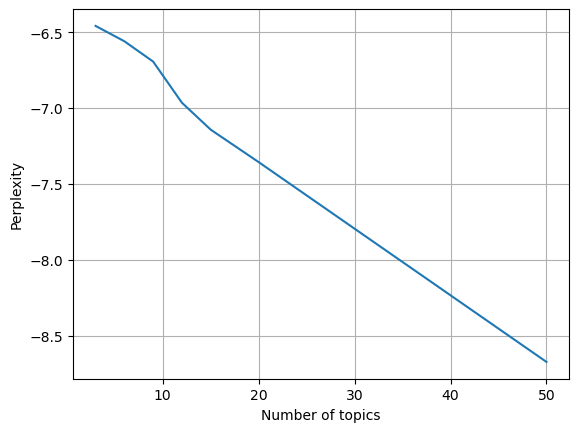

In [ ]:
plt.plot([3, 6, 9, 12, 15, 20, 50], perplexity)
plt.grid()
plt.xlabel("Number of topics")
plt.ylabel("Perplexity")
plt.show()

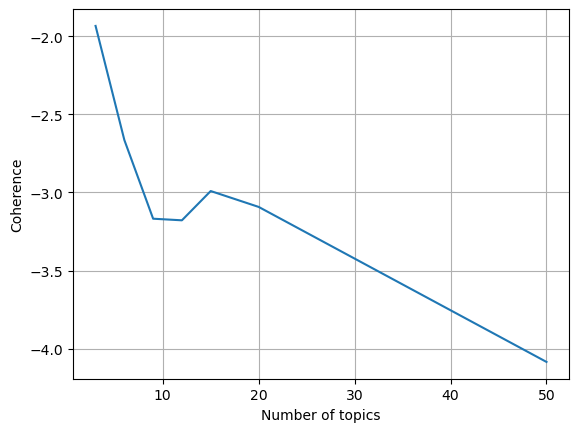

In [ ]:
plt.plot([3, 6, 9, 12, 15, 20, 50], coherence)
plt.grid()
plt.xlabel("Number of topics")
plt.ylabel("Coherence")
plt.show()

We observe that perplexity decreases with an increase in the number of topics, but coherence peaks at 3 topics, which may be insufficient for comprehensive analysis. Notably, coherence significantly diminishes beyond 15 topics, indicating a loss in topic distinction. Therefore, we determine that 15 topics represent an optimal balance, offering lower perplexity without a substantial compromise in coherence. We must also qualitatively assess the topics to confirm their relevance and distinctiveness.

# 6.Alpha and Eta in LDA

In Latent Dirichlet Allocation (LDA), the Alpha and Eta parameters play a crucial role in shaping the topic distribution and the word distribution within a topic, respectively. By examining their values and their impact on model performance, we can gain insight into the underlying structure of the topics discovered by the model. Alpha controls document topic density. Lower alpha values assign fewer topics to each document, while higher alpha values assign more topics to each document. Eta affects the keyword density. Similar to alpha, lower eta values result in a sparser distribution of keywords, while higher eta values result in a denser distribution of keywords. By comparing the coherence scores of the three models, we can determine the best combination of alpha and eta values that produce the most coherent topics. Higher coherence scores indicate that the topics generated by the model are more semantically coherent and interpretable. Through this analysis, we aim to determine the alpha and eta values that yield the most meaningful and coherent topics, providing valuable insights for topic modeling tasks.

In [ ]:
from gensim import corpora, models
from gensim.models import CoherenceModel

# Creating a dictionary
dictionary = corpora.Dictionary(list_doc)

# Corpus needed for Topic Modeling
corpus = [dictionary.doc2bow(text) for text in list_doc]

# Print the words in topics with their weights
def print_topic_words(model, num_top_words):
    for topic_id in range(model.num_topics):
        words = model.show_topic(topic_id, topn=num_top_words)
        topic_words = ", ".join([word for word, _ in words])
        print(f"Topic {topic_id}: {topic_words}")

In [ ]:
# model 1: LDA with symmetric alpha
lda_model1 = models.LdaModel(corpus, num_topics=15, id2word=dictionary, passes=1, alpha='symmetric')
print_topic_words(lda_model1, 10)

Topic 0: recommend, would, stay, highly, place, clean, host, responsive, apartment, boston
Topic 1: public, transportation, elevator, transit, close, boston, accessible, easily, transport, die
Topic 2: room, bathroom, night, bed, one, noise, shower, kitchen, small, good
Topic 3: check, easy, clean, clear, place, early, stay, super, great, quick
Topic 4: great, stay, location, place, would, clean, definitely, boston, perfect, everything
Topic 5: walking, distance, location, boston, within, great, apartment, end, perfect, many
Topic 6: nice, place, good, great, clean, host, location, stay, responsive, really
Topic 7: home, like, felt, stay, feel, beautiful, made, boston, comfortable, family
Topic 8: stay, place, time, boston, back, everything, amazing, definitely, come, host
Topic 9: space, great, place, little, two, nice, people, group, enough, small
Topic 10: easy, access, unit, get, find, center, floor, everything, close, city
Topic 11: would, didnt, apartment, stay, loud, host, door,

In [ ]:
# evaluate the models using Coherence Score
coherence_model_lda1 = CoherenceModel(model=lda_model1, texts=list_doc, dictionary=dictionary, coherence='c_v')
coherence_lda1 = coherence_model_lda1.get_coherence()

print("\nCoherence Score for Model 1:", coherence_lda1)


Coherence Score for Model 1: 0.5674578626244333


In [ ]:
# model 2: LDA with asymmetric alpha and fixed Beta
lda_model2 = models.LdaModel(corpus, num_topics=15, id2word=dictionary, passes=1, alpha='asymmetric', eta=0.5)
print_topic_words(lda_model2, 10)

Topic 0: great, stay, place, location, clean, host, nice, would, responsive, recommend
Topic 1: kitchen, room, bathroom, comfortable, well, space, bed, coffee, clean, staff
Topic 2: boston, stay, place, would, perfect, great, definitely, location, recommend, time
Topic 3: close, neighborhood, safe, quiet, public, clean, place, walkable, great, airport
Topic 4: parking, street, great, park, walk, car, right, away, nice, place
Topic 5: room, night, one, place, would, good, noise, unit, stay, apartment
Topic 6: walking, distance, within, many, lots, several, everything, location, food, lot
Topic 7: home, stay, place, beautiful, host, back, amazing, like, everything, thank
Topic 8: good, hotel, value, money, apt, smaller, new, price, promptly, expensive
Topic 9: beat, question, cant, accommodation, cleanliness, multiple, throughout, times, meet, solo
Topic 10: apartment, end, boston, location, north, walk, building, beautiful, bay, right
Topic 11: service, pour, bien, worth, nous, dirty, b

In [ ]:
# evaluate the models using Coherence Score
coherence_model_lda2 = CoherenceModel(model=lda_model2, texts=list_doc, dictionary=dictionary, coherence='c_v')
coherence_lda2 = coherence_model_lda2.get_coherence()

print("Coherence Score for Model 2:", coherence_lda2)

Coherence Score for Model 2: 0.5079518903279908


In [ ]:
# model 3: LDA with auto alpha and Beta
lda_model3 = models.LdaModel(corpus, num_topics=15, id2word=dictionary, passes=1, alpha='auto', eta='auto')
print_topic_words(lda_model3, 10)

Topic 0: parking, street, car, park, find, spot, free, game, die, neat
Topic 1: home, stay, like, felt, house, made, beautiful, sure, feel, back
Topic 2: boston, walk, get, airport, place, close, city, downtown, minute, easy
Topic 3: neighborhood, quiet, safe, close, walk, walkable, station, apartment, area, street
Topic 4: walking, distance, within, many, boston, store, food, location, grocery, everything
Topic 5: public, easy, super, space, transportation, comfy, access, bed, clean, close
Topic 6: check, quick, hotel, respond, early, always, help, room, para, tidy
Topic 7: unit, good, host, service, issue, price, due, con, check, arrival
Topic 8: responsive, helpful, host, friendly, super, accommodating, experience, extremely, kind, bien
Topic 9: coffee, could, worth, hotel, wish, water, air, even, stay, morning
Topic 10: boston, perfect, location, everything, end, trip, back, best, weekend, apartment
Topic 11: apartment, well, kitchen, staff, space, comfortable, family, spacious, be

In [ ]:
# evaluate the models using Coherence Score
coherence_model_lda3 = CoherenceModel(model=lda_model3, texts=list_doc, dictionary=dictionary, coherence='c_v')
coherence_lda3 = coherence_model_lda3.get_coherence()

print("Coherence Score for Model 3:", coherence_lda3)

Coherence Score for Model 3: 0.5896487857825302


Based on the models, we are able to reveals the nuanced impact of alpha and eta parameters on the topic modeling results. The model undergoes multiple passes over the corpus, typically until convergence criteria are met. We set passes equal to 1 due to heavy training time. Using higher number of passes can improve model convergence and stability but comes with increased computational cost. In model 1, symmetric alpha values were utilized, resulting in an equal prior probability for all topics. The topics exhibited varying degrees of coherence, with a coherence score of 0.567. Model 2 employed asymmetric alpha and fixed eta parameters, allowing for different prior probabilities for each topic and a fixed topic-word density, respectively. Despite the fixed eta value of 0.5, the coherence score was slightly lower at 0.508. In contrast, Model 3 employed auto alpha and eta parameters, enabling the model to adaptively learn prior distributions from the data. This approach yielded the highest coherence score of 0.590, indicating more interpretable and semantically coherent topics. As conclusion, we can see the analysis undersocre the importance of parameter selection in LDA models. For our project, auto alpha and eta demonstrating superior performance in capturing the underlying structure of textual data.


# 7.LDA Visualization

## 7.1 Word Clouds

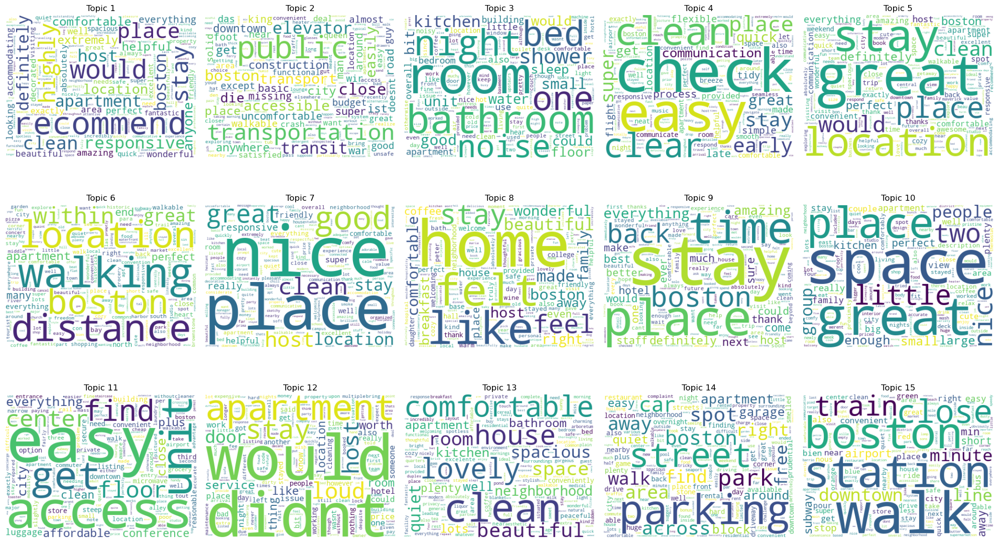

In [ ]:
# model 1

import matplotlib.pyplot as plt
from wordcloud import WordCloud

num_topics = lda_model1.num_topics

# Subsets
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

# Generate the word cloud
for t in range(num_topics):
    words_freq = dict(lda_model1.show_topic(t, 200))
    wc = WordCloud(background_color='white', width=400, height=300)
    wc.generate_from_frequencies(words_freq)

    axes[t].imshow(wc, interpolation='bilinear')
    axes[t].axis('off')
    axes[t].set_title(f'Topic {t+1}')

for ax in axes[num_topics:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

The model 1 word cloud revealed the importance of satisfaction with cleanliness, comfortable accommodations, proximity to bars and downtown Boston, and location within walking distance to major attractions. The visuals emphasize the value of quiet bedrooms, easy check-in, spacious living areas and easy transport links such as nearby trains. Hospitality and the feeling of being at home are also highlighted, indicating that the host is doing a good job making guests feel welcome. Overall, these themes indicate how efficiently guests prioritize location, comfort, and stay experience.

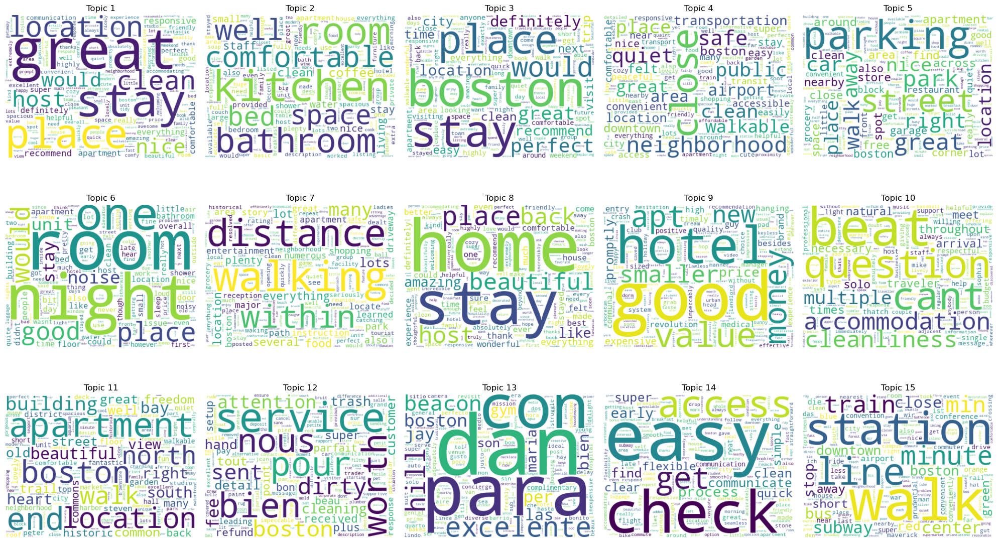

In [ ]:
# model 2

num_topics = lda_model2.num_topics

# Subsets
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

# Generate the word cloud
for t in range(num_topics):
    words_freq = dict(lda_model2.show_topic(t, 200))
    wc = WordCloud(background_color='white', width=400, height=300)
    wc.generate_from_frequencies(words_freq)

    axes[t].imshow(wc, interpolation='bilinear')
    axes[t].axis('off')
    axes[t].set_title(f'Topic {t+1}')

for ax in axes[num_topics:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

The model 2 word cloud highlights guest satisfaction with a great location, especially in Boston, which is walkable and well-served by public transportation. Clean and comfortable accommodations were recurring themes, with special appreciation for quiet rooms, efficient check-in process and overall value. The presence of terms like "beautiful home" and "amazing place" indicates that guests were impressed by the look and feel of their stay. Words like "attention" and "service" show a focus on customer care, while "parking" is an actual concern for many people. Proximity to the city center, accessibility and quality of living space appear to be critical to a positive guest experience.

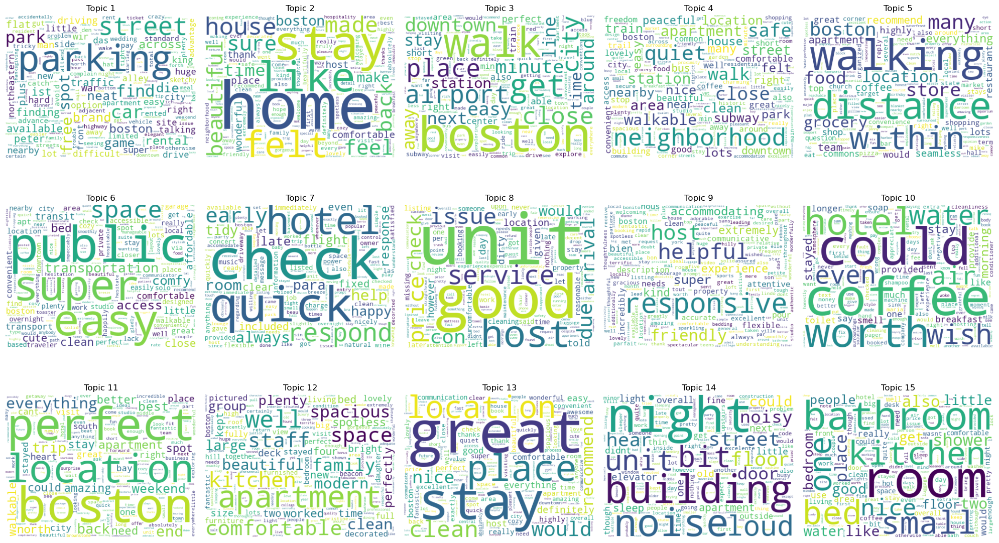

In [ ]:
# model 3

num_topics = lda_model3.num_topics

# Subsets
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

# Generate the word cloud
for t in range(num_topics):
    words_freq = dict(lda_model3.show_topic(t, 200))
    wc = WordCloud(background_color='white', width=400, height=300)
    wc.generate_from_frequencies(words_freq)

    axes[t].imshow(wc, interpolation='bilinear')
    axes[t].axis('off')
    axes[t].set_title(f'Topic {t+1}')

for ax in axes[num_topics:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

The model 3 word cloud shows that guests value location, especially in Boston, where the emphasis is on being within walking distance of shops and attractions. Comfort, cleanliness and quietness are essential to a good stay. Space is appreciated, but parking and street noise are issues. Excellent service from the hosts is very important, and amenities such as kitchens and bathrooms are of particular concern. Some topics presented room for improvement. Overall, sentiment is positive, but there are some areas for improvement.


## 7.2 Intertopic Distance Map


The `pyLDAvis.gensim_models` module is a powerful visualization tool for anyone working with text data. It brings to life the abstract and often complex topic models created by LDA by turning them into interactive, easy-to-understand visualizations. With this tool, we can see clusters of topics laid out on a plane, showing how topics relate to each other and the prevalence of each topic in our data set.

In [ ]:
!pip install pyLDAvis
!pip install --upgrade joblib
!pip install --upgrade pyLDAvis

In [ ]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# model 1
lda_vis = gensimvis.prepare(lda_model1, corpus, dictionary)
pyLDAvis.display(lda_vis)

In [ ]:
# model 2
lda_vis = gensimvis.prepare(lda_model2, corpus, dictionary)
pyLDAvis.display(lda_vis)

In [ ]:
# model 3
lda_vis = gensimvis.prepare(lda_model3, corpus, dictionary)
pyLDAvis.display(lda_vis)

#8.Conclusions

Concluding our sentiment analysis on Boston's Airbnb market, we found that guest experiences were predominantly positive, with a clear preference for entire homes or apartments. The pandemic's impact on the number of reviews highlighted the resilience and recovery of the local tourism and hospitality sector. Our topic analysis revealed key areas of guest interest, such as service quality and cleanliness. The optimal configuration for our Latent Dirichlet Allocation (LDA) model was identified through meticulous evaluation, ensuring the relevance and distinctiveness of the derived topics. Moving forward, our focus will shift to a granular analysis by Boston areas, aiming to provide targeted recommendations for hosts and to contribute to the strategic development of Airbnb's offerings in the city. This endeavor not only enhances our understanding of the Airbnb market in Boston but also sets the stage for future studies to explore dynamic pricing strategies and improve guest booking experiences.

#9.References

1. Use of AI: We used AI for grammar checking, and content repetition to improve readability, debugging, and helping us to find some ways to solve errors.

2. Alteryx Community. (2020). Getting to the Point with Topic Modeling Part 3: Interpreting the Results. Retrieved from https://community.alteryx.com/t5/Data-Science/Getting-to-the-Point-with-Topic-Modeling-Part-3-Interpreting-the/ba-p/614992

3. Scikit-learn Developers. (n.d.). LDA. Retrieved from https://scikit-learn.org/0.16/modules/generated/sklearn.lda.LDA.html

4. Scikit-learn Developers. (n.d.). Preprocessing data. Retrieved from https://scikit-learn.org/0.16/modules/preprocessing.html#preprocessing

5. GeeksforGeeks. (n.d.). Generating Word Cloud in Python. Retrieved from https://www.geeksforgeeks.org/generating-word-cloud-python/

6. Stack Abuse. (n.d.). Python for NLP: Working with the Gensim Library (Part 1). Retrieved from https://stackabuse.com/python-for-nlp-working-with-the-gensim-library-part-1/

